In [ ]:
# import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import polars as pl

In [2]:
# Load the dataset
df = pd.read_csv('/Users/arsenymoshko/Downloads/online_shoppers_intention.csv')
df_pl = pl.read_csv('/Users/arsenymoshko/Downloads/online_shoppers_intention.csv')
# Display the first few rows of the dataframe
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [6]:
# Display the shape of the dataframe
df.shape
# The size is small, 18 columns and 12330 rows

(12330, 18)

In [10]:
# Display information about the dataframe
df.info()
# there are some missing values in the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12131 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  11839 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12231 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [11]:
# Display descriptive statistics of the dataframe of all columns
df.describe(include='all')

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,12330.000000,12330.000000,12330.000000,12131.000000,12330.000000,11839.000000,12330.000000,12231.000000,12330.000000,12330.000000,12330,12330.000000,12330.000000,12330.000000,12330.000000,12330,12330,12330
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,NaN,NaN,NaN,NaN,3,2,2
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,May,NaN,NaN,NaN,NaN,Returning_Visitor,False,False
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3348,NaN,NaN,NaN,NaN,10551,9462,10422
mean,2.315166,80.818611,0.503569,34.724502,31.731468,1190.534914,0.022191,0.043021,5.889258,0.061427,NaN,2.124006,2.357097,3.147364,4.069586,NaN,NaN,NaN
std,3.321784,176.779107,1.270156,141.655684,44.475503,1908.447706,0.048488,0.048562,18.568437,0.198917,NaN,0.911325,1.717277,2.401591,4.025169,NaN,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN
25%,0.000000,0.000000,0.000000,0.000000,7.000000,183.854167,0.000000,0.014286,0.000000,0.000000,NaN,2.000000,2.000000,1.000000,2.000000,NaN,NaN,NaN
50%,1.000000,7.500000,0.000000,0.000000,18.000000,597.625000,0.003112,0.025141,0.000000,0.000000,NaN,2.000000,2.000000,3.000000,2.000000,NaN,NaN,NaN
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1462.554562,0.016813,0.050000,0.000000,0.000000,NaN,3.000000,2.000000,4.000000,4.000000,NaN,NaN,NaN


"Administrative", "Administrative Duration", "Informational", "Informational Duration", "Product Related" and "Product Related Duration" represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another. The "Bounce Rate", "Exit Rate" and "Page Value" features represent the metrics measured by "Google Analytics" for each page in the e-commerce site. The value of "Bounce Rate" feature for a web page refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session. The value of "Exit Rate" feature for a specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session. The "Page Value" feature represents the average value for a web page that a user visited before completing an e-commerce transaction. The "Special Day" feature indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentina’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8. The dataset also includes operating system, browser, region, traffic type, visitor type as returning or new visitor, a Boolean value indicating whether the date of the visit is weekend, and month of the year.

In [ ]:
df.isna().sum()
# there are missing values in the columns Informational_Duration, ProductRelated_Duration, ExitRates. So we will fill them with the mean of the column

Administrative               0
Administrative_Duration      0
Informational                0
Informational_Duration     199
ProductRelated               0
ProductRelated_Duration    491
BounceRates                  0
ExitRates                   99
PageValues                   0
SpecialDay                   0
Month                        0
OperatingSystems             0
Browser                      0
Region                       0
TrafficType                  0
VisitorType                  0
Weekend                      0
Revenue                      0
dtype: int64

In [ ]:
df['Informational_Duration'].fillna(df['Informational_Duration'].mean(), inplace=True, axis=0)
df['ProductRelated_Duration'].fillna(df['ProductRelated_Duration'].mean(), inplace=True, axis=0)
df['ExitRates'].fillna(df['ExitRates'].mean(), inplace=True, axis=0)
# check the missing values again
df.isna().sum()
# now there are no missing values in the dataset

In [14]:
# check the duplicates in the dataset
df.duplicated().sum(axis=0)
# there are 109 duplicates in the dataset, we will drop them
df.drop_duplicates(inplace=True)
# check the duplicates again
df.duplicated().sum(axis=0)
# now there are no duplicates in the dataset

0

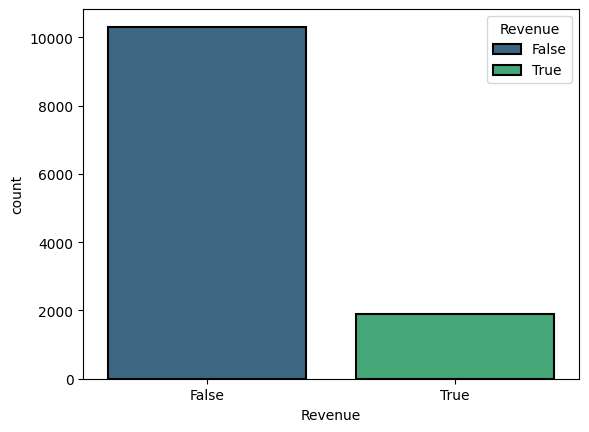

In [21]:
# now we can start the EDA process
# Let's visualize the distribution of the target variable 'Revenue' and see how many users made a purchase
sns.countplot(x='Revenue', data=df, palette='viridis', hue='Revenue', edgecolor='black', linewidth=1.5)
plt.show()
# The dataset is imbalanced, there are more users who did not make a purchase than those who made a purchase(0.86 vs 0.14). 
# We will use this information later in the modeling process.

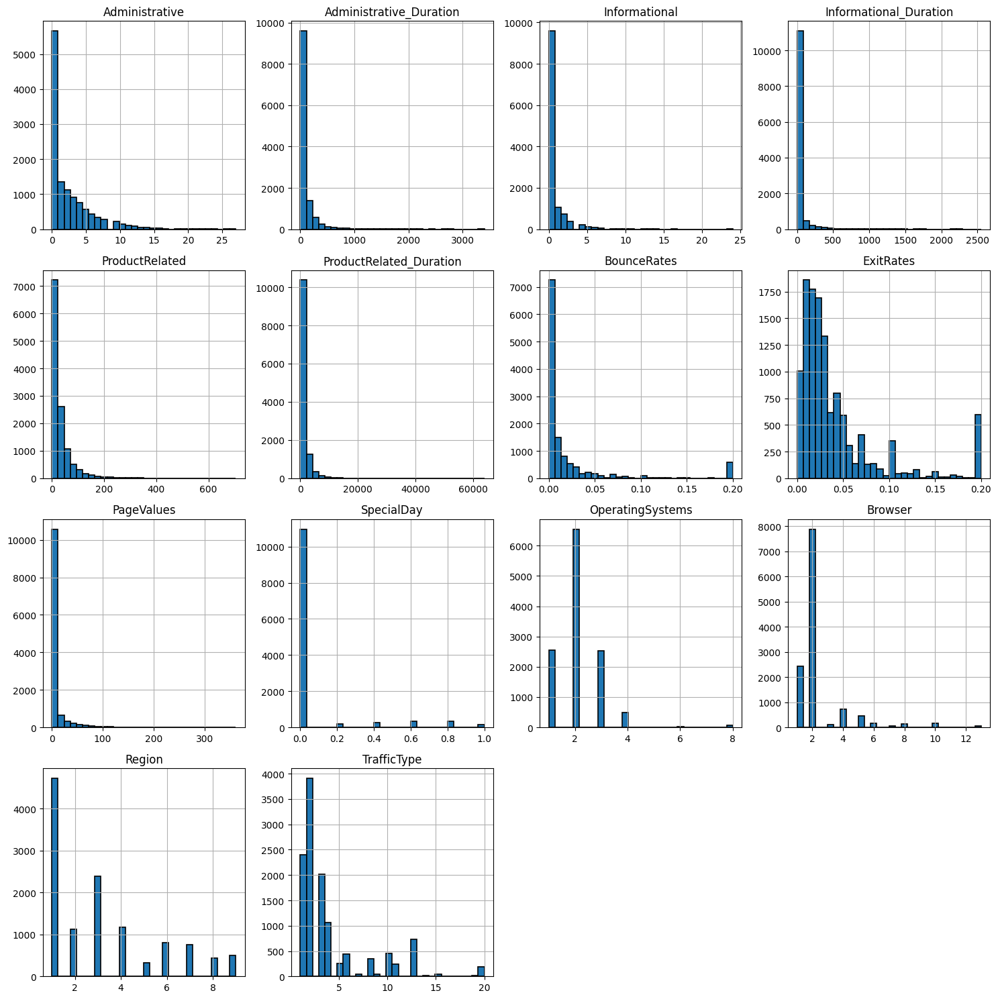

In [ ]:
# Visualize the distribution of all numerical features in the dataset
df.hist(figsize=(15, 15), bins=30, edgecolor='black', linewidth=1.2)
plt.tight_layout()
plt.show()
# We can see that most of the numerical features are right-skewed, which is common in e-commerce datasets because of the presence of a few high-value transactions(outliers).

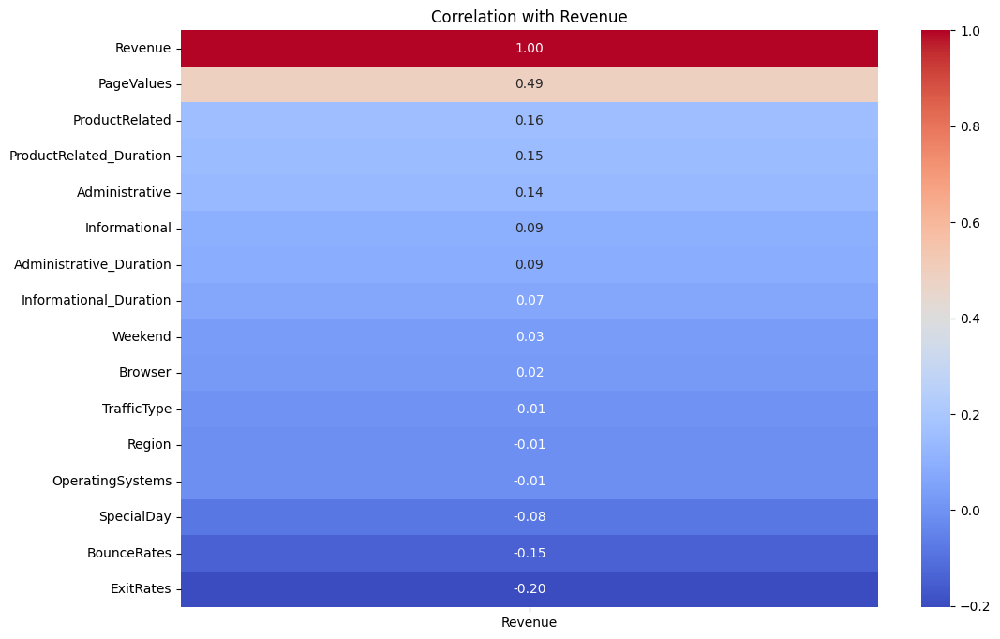

In [31]:
# lets look for the connection between the features and the target variable 'Revenue'
plt.figure(figsize=(12, 8))
df['Revenue'] = df['Revenue'].astype(int)  # Ensure 'Revenue' is treated as a categorical variable
sns.heatmap(df.corr(numeric_only=True)[['Revenue']].sort_values(by='Revenue', ascending=False), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation with Revenue')
plt.show()
# We cna see that the features 'PageValues', 'ExitRates', 'ProductRelated_Duration', 'ProductRelated' and 'BounceRates' have the highest correlation with the target variable 'Revenue'.

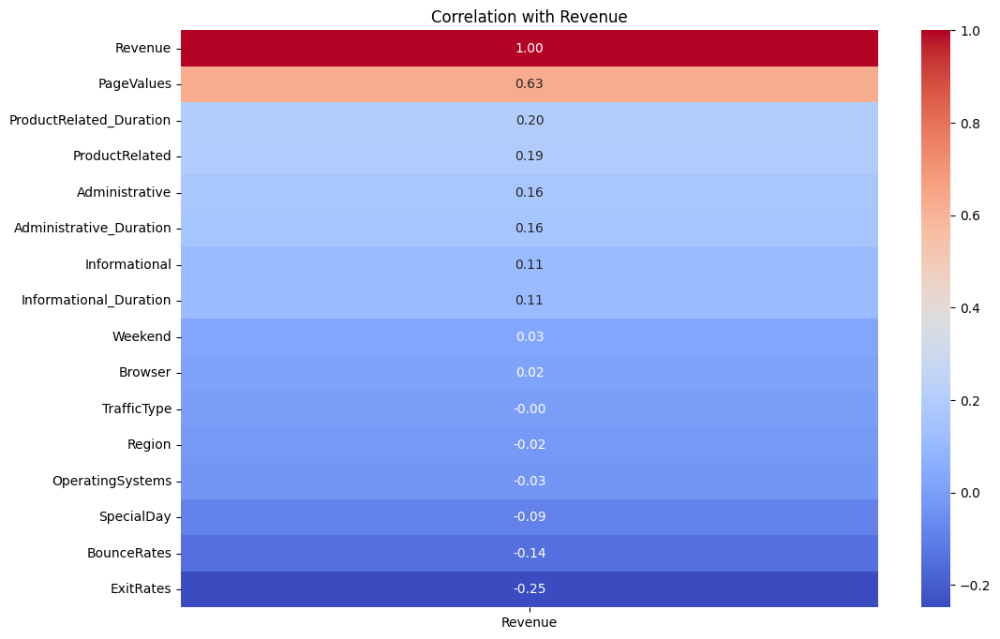

In [37]:
# Just to make sure, lets use another method of correlation matrix visualization: Kendall's or Spearman's
plt.figure(figsize=(12, 8))
df['Revenue'] = df['Revenue'].astype(int)  # Ensure 'Revenue' is treated as a categorical variable
sns.heatmap(df.corr(numeric_only=True, method='spearman')[['Revenue']].sort_values(by='Revenue', ascending=False), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation with Revenue')
plt.show()
# Here the PageValues, ExitRates, ProductRelated_Duration are much more correlated with the target variable than the others

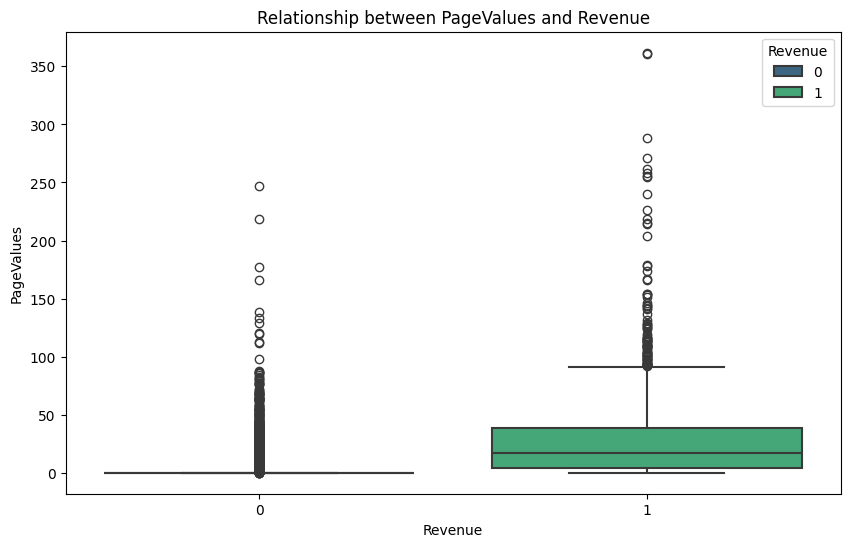

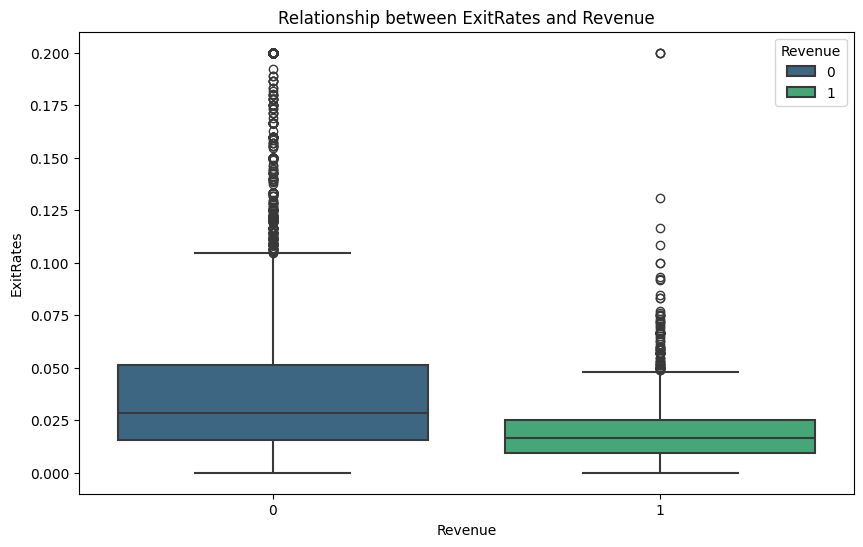

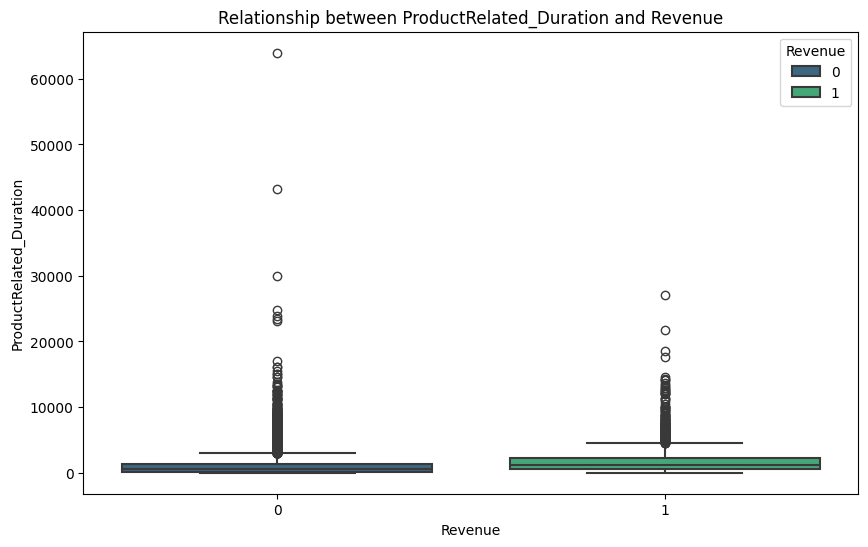

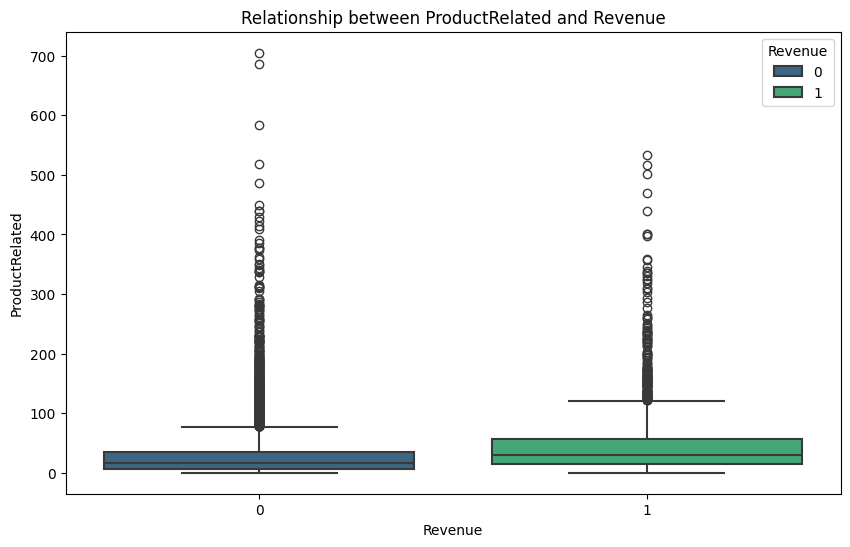

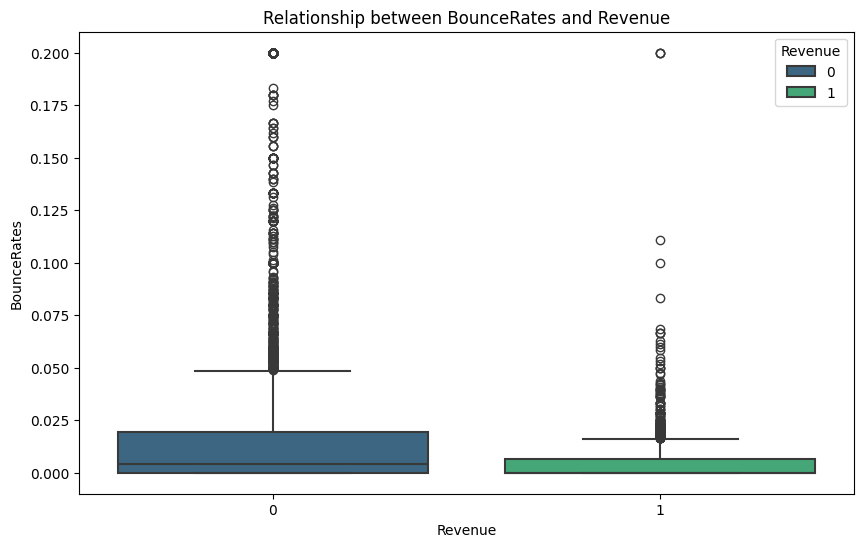

In [34]:
# Let's visualize the relationship between these features and the target variable 'Revenue'
features = ['PageValues', 'ExitRates', 'ProductRelated_Duration', 'ProductRelated', 'BounceRates']
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Revenue', y=feature, data=df, palette='viridis', hue='Revenue', linewidth=1.5)
    plt.title(f'Relationship between {feature} and Revenue')
    plt.show()    
# We can see that therea are significant differences in the distributions of these features and that there are many outliers in the dataset. 


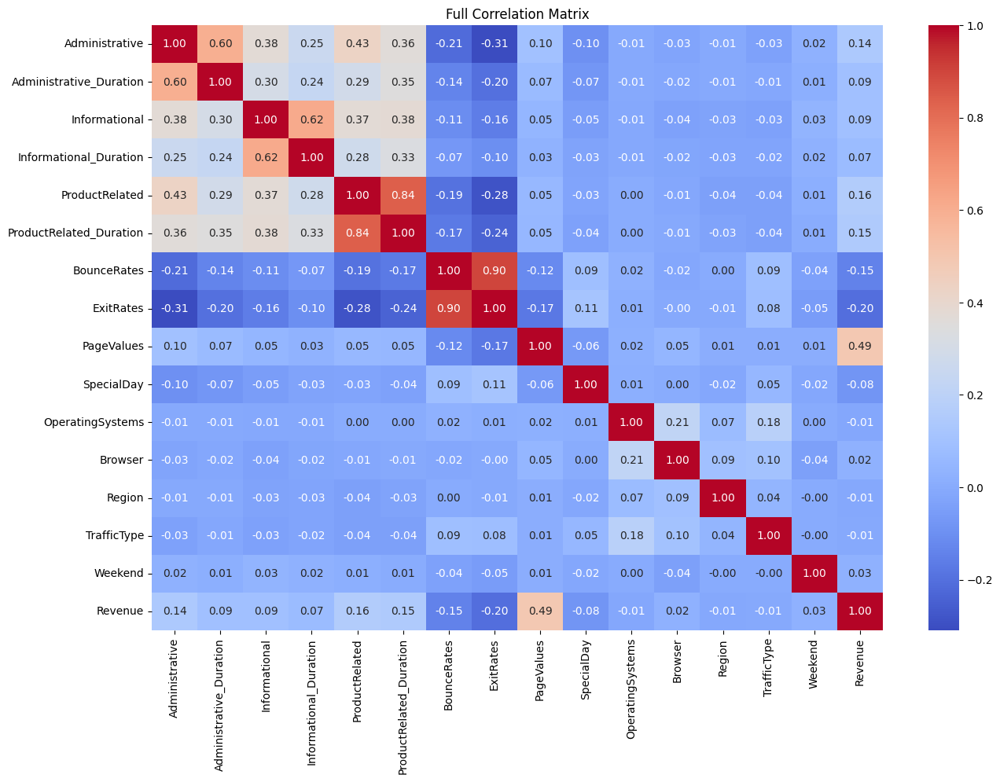

In [ ]:
# now lets see the full correlation matrix of the dataset
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Full Correlation Matrix')
plt.show()
# the highest correlation is between the durations of each page and the page itself, which is expected
# We can also see high corr between 'ExitRates' and 'BounceRates', which is also expected as they are both related to user behavior on the website.
# also exit rates correlates the most negatively with Administrative(duration too), product related and page values, which means that the higher the exit rates, the lower the values of these features.

In [ ]:
!pip install dython

In [42]:
df.dtypes

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                      int64
dtype: object

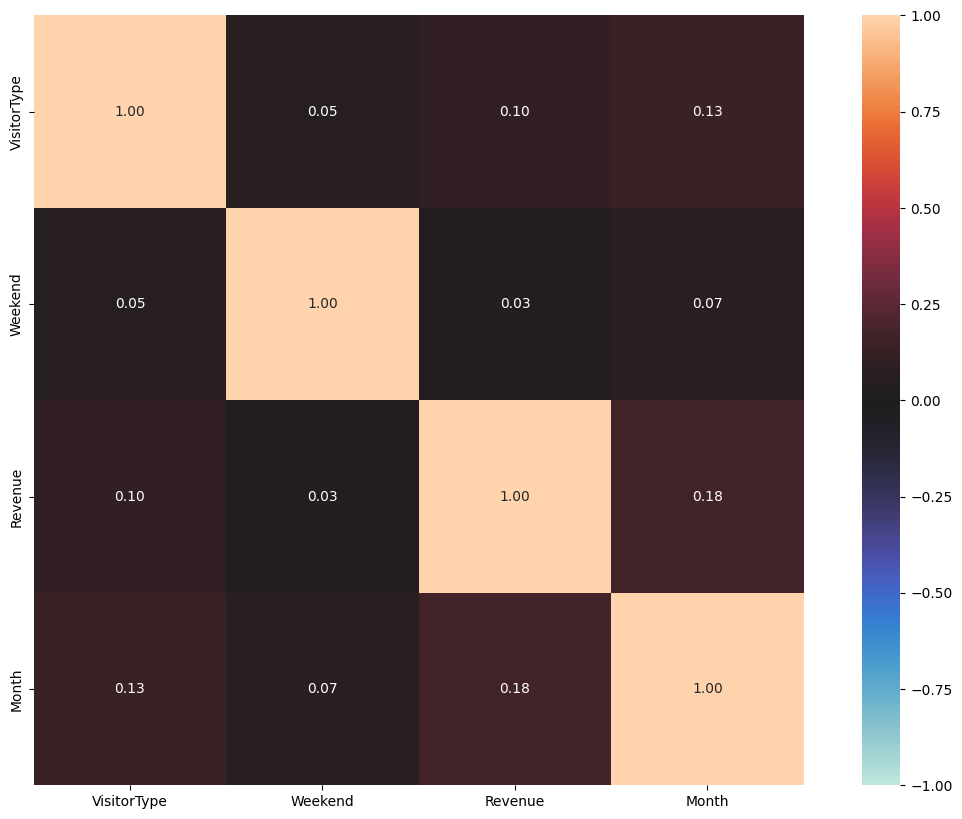

{'corr':              VisitorType   Weekend   Revenue     Month
 VisitorType     1.000000  0.053418  0.103550  0.134444
 Weekend         0.053418  1.000000  0.027858  0.065412
 Revenue         0.103550  0.027858  1.000000  0.175961
 Month           0.134444  0.065412  0.175961  1.000000,
 'ax': <Axes: >}

In [44]:
# Now lets check the distribution of categorical features using the V-Kramer's test

from dython.nominal import associations

associations(df[['VisitorType', 'Weekend', 'Revenue', 'Month']], nominal_columns=df.dtypes[df.dtypes == 'object'].index.tolist(), figsize=(15, 10), plot=True)
# There is only slight correlation between the Revenue and the Month feature, which is expected as the month of the year can influence the purchasing behavior of users(seasonality).

In [47]:
# Now for fun Увеличить размер данных простым дублированием до 1_000_000 строк в датасете. Провести сравнение скорости работы Pandas и Polars на увеличенном датасете по параметрам: загрузка данных (1 балл), фильтрация данных (1 балл), агрегация данных (1 балл)
df_new = pd.concat([df] * 100, ignore_index=True)  # Duplicate the dataset to increase its size
df_pl_new = pl.concat([df_pl] * 100)  # Duplicate the Polars dataset

In [59]:
%%time
df_new = pd.read_csv('/Users/arsenymoshko/Downloads/online_shoppers_intention.csv') 

CPU times: user 11.5 ms, sys: 17.2 ms, total: 28.7 ms
Wall time: 33.1 ms


In [60]:
%%time
df_pl_new = pl.read_csv('/Users/arsenymoshko/Downloads/online_shoppers_intention.csv')

CPU times: user 10.9 ms, sys: 19.6 ms, total: 30.5 ms
Wall time: 17.5 ms


In [67]:
%%time
filtered_df = df_new[df_new['Revenue'] == 1]  # Filter rows where Revenue is 1

CPU times: user 1.16 ms, sys: 739 µs, total: 1.9 ms
Wall time: 1.47 ms


In [68]:
%%time
filtered_df_pl = df_pl_new.filter(pl.col('Revenue') == 1)  # Filter rows where Revenue is 1

CPU times: user 4.84 ms, sys: 3.08 ms, total: 7.92 ms
Wall time: 2.67 ms


In [72]:
%%time
aggregated_df = df_new.groupby('Month').agg({'Revenue': 'sum'})  #

CPU times: user 2.74 ms, sys: 7.85 ms, total: 10.6 ms
Wall time: 10.8 ms


In [73]:
%%time
aggregated_df_pl = df_pl_new.group_by('Month').agg(pl.col('Revenue').sum())  # Aggregate data by Month and sum the Revenue

CPU times: user 3.17 ms, sys: 8.2 ms, total: 11.4 ms
Wall time: 4.24 ms


In [76]:
#pandas profiling
from ydata_profiling import ProfileReport
profile_report = ProfileReport(df_new, title='Pandas Profiling Report', explorative=True)
profile_report.to_file("pandas_profiling_report.html")
# The profiling report will give us a detailed overview of the dataset, including missing values, correlations, and distributions of features.
# the html file is located at /Users/arsenymoshko/Downloads/pandas_profiling_report.html
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]